**Load data**

In [1]:
import numpy as np
import pandas as pd
import glob
import matplotlib.pyplot as plt

In [32]:
path = "../data/raw/*.csv"   # مسیر فولدر
files = glob.glob(path)

dfs = []

for df in files:
    df = pd.read_csv(df, index_col=0)
    dfs.append(df)

dfs


[       <TICKER>  <DTYYYYMMDD>   <HIGH>    <LOW>  <CLOSE>       <VALUE>  \
 0     Abadgaran      20050115   1800.0   1800.0   1800.0    2592000000   
 1     Abadgaran      20050116   1890.0   1890.0   1890.0     491626800   
 2     Abadgaran      20050117   1984.0   1984.0   1984.0    2976000000   
 3     Abadgaran      20050126   2083.0   2083.0   2083.0     560735268   
 4     Abadgaran      20050130   2187.0   2060.0   2162.0    5781634832   
 ...         ...           ...      ...      ...      ...           ...   
 3399  Abadgaran      20230121  29320.0  27330.0  27940.0   32057432130   
 3400  Abadgaran      20230122  27500.0  26550.0  26840.0   41931226920   
 3401  Abadgaran      20230123  28180.0  26460.0  27750.0   74147830400   
 3402  Abadgaran      20230124  29130.0  27820.0  28930.0   48997211580   
 3403  Abadgaran      20230125  30370.0  28970.0  29830.0  243714893390   
 
         <VOL>  <OPENINT> <PER>   <OPEN>   <LAST>  
 0     1440000       1810     D   1800.0   180

In [33]:
dfs[0].head()

,<TICKER>,<DTYYYYMMDD>,<HIGH>,<LOW>,<CLOSE>,<VALUE>,<VOL>,<OPENINT>,<PER>,<OPEN>,<LAST>
0,Abadgaran,20050115,1800.0,1800.0,1800.0,2592000000,1440000,1810,D,1800.0,1800.0
1,Abadgaran,20050116,1890.0,1890.0,1890.0,491626800,260120,257,D,1800.0,1890.0
2,Abadgaran,20050117,1984.0,1984.0,1984.0,2976000000,1500000,1227,D,1890.0,1984.0
3,Abadgaran,20050126,2083.0,2083.0,2083.0,560735268,269196,198,D,1984.0,2083.0
4,Abadgaran,20050130,2187.0,2060.0,2162.0,5781634832,2673786,1834,D,2083.0,2162.0


In [34]:
dfs[0].info()



<class 'pandas.core.frame.DataFrame'>
Index: 3404 entries, 0 to 3403
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   <TICKER>      3404 non-null   object 
 1   <DTYYYYMMDD>  3404 non-null   int64  
 2   <HIGH>        3404 non-null   float64
 3   <LOW>         3404 non-null   float64
 4   <CLOSE>       3404 non-null   float64
 5   <VALUE>       3404 non-null   int64  
 6   <VOL>         3404 non-null   int64  
 7   <OPENINT>     3404 non-null   int64  
 8   <PER>         3404 non-null   object 
 9   <OPEN>        3404 non-null   float64
 10  <LAST>        3404 non-null   float64
dtypes: float64(5), int64(4), object(2)
memory usage: 319.1+ KB


In [35]:
dfs[0].describe()

,<DTYYYYMMDD>,<HIGH>,<LOW>,<CLOSE>,<VALUE>,<VOL>,<OPENINT>,<OPEN>,<LAST>
count,3.404000e+03,3404.000000,3404.000000,3404.000000,3.404000e+03,3.404000e+03,3404.000000,3404.000000,3404.000000
mean,2.014609e+07,9074.958872,8760.332256,8999.994125,9.859492e+09,9.252546e+05,211.481199,8991.171857,8896.333431
std,5.162449e+04,14513.432425,14049.614627,14487.066602,3.348258e+10,1.713977e+06,408.908252,14483.418207,14236.999101
min,2.005012e+07,983.000000,430.000000,1019.000000,1.019000e+03,1.000000e+00,1.000000,1011.000000,983.000000
25%,2.011102e+07,1779.000000,1710.000000,1746.000000,1.432432e+08,5.719350e+04,16.000000,1745.750000,1743.000000
50%,2.015091e+07,2446.000000,2350.000000,2391.500000,9.359396e+08,3.534150e+05,70.500000,2388.500000,2390.000000
75%,2.019043e+07,4260.750000,4118.500000,4226.750000,4.929468e+09,1.118185e+06,238.000000,4217.250000,4231.500000
max,2.023012e+07,58900.000000,56500.000000,57050.000000,8.792691e+11,4.401018e+07,9547.000000,57050.000000,57120.000000


**Cleaning data**

In [36]:
column_mapping = {

    '<HIGH>': 'high',
    '<LOW>': 'low', 
    '<CLOSE>': 'close',
    '<VALUE>': 'value',
    '<VOL>': 'volume',
    '<OPENINT>': 'open_interest',
    '<PER>': 'period',
    '<OPEN>': 'open',
    '<LAST>': 'last',
    '<DTYYYYMMDD>': 'date',
    '<TICKER>': 'ticker'
}

for i in range(len(dfs)):
    dfs[i] = dfs[i].rename(columns=column_mapping)
    dfs[i]['date'] = pd.to_datetime(dfs[i]['date'], format='%Y%m%d')
    dfs[i] = dfs[i].sort_values("date").reset_index(drop=True)
    dfs[i] = dfs[i][dfs[i]['volume'] > 0]

print(dfs[i].head())

       ticker       date    high     low   close         value    volume  \
0  Pars.Agro. 2018-10-17  3500.0  3500.0  3500.0  113869000000  32534000   
1  Pars.Agro. 2018-10-20  3675.0  3675.0  3556.0     168950775     45973   
2  Pars.Agro. 2018-10-21  3733.0  3733.0  3733.0     534640260    143220   
3  Pars.Agro. 2018-10-22  3919.0  3919.0  3919.0     609228145    155455   
4  Pars.Agro. 2018-10-23  4114.0  4114.0  4114.0     663937890    161385   

   open_interest period    open    last  
0         212123      D  1000.0  3500.0  
1            344      D  3500.0  3675.0  
2            487      D  3556.0  3733.0  
3           1031      D  3733.0  3919.0  
4           1068      D  3919.0  4114.0  


In [37]:
dfs[0].describe()

,date,high,low,close,value,volume,open_interest,open,last
count,3404,3404.000000,3404.000000,3404.000000,3.404000e+03,3.404000e+03,3404.000000,3404.000000,3404.000000
mean,2015-01-17 03:20:56.404230144,9074.958872,8760.332256,8999.994125,9.859492e+09,9.252546e+05,211.481199,8991.171857,8896.333431
min,2005-01-15 00:00:00,983.000000,430.000000,1019.000000,1.019000e+03,1.000000e+00,1.000000,1011.000000,983.000000
25%,2011-10-24 12:00:00,1779.000000,1710.000000,1746.000000,1.432432e+08,5.719350e+04,16.000000,1745.750000,1743.000000
50%,2015-09-06 12:00:00,2446.000000,2350.000000,2391.500000,9.359396e+08,3.534150e+05,70.500000,2388.500000,2390.000000
75%,2019-04-29 06:00:00,4260.750000,4118.500000,4226.750000,4.929468e+09,1.118185e+06,238.000000,4217.250000,4231.500000
max,2023-01-25 00:00:00,58900.000000,56500.000000,57050.000000,8.792691e+11,4.401018e+07,9547.000000,57050.000000,57120.000000
std,NaN,14513.432425,14049.614627,14487.066602,3.348258e+10,1.713977e+06,408.908252,14483.418207,14236.999101


In [38]:
#concat data
panel_df = pd.concat(dfs, ignore_index=True)
panel_df = panel_df.sort_values(['ticker', 'date'])
panel_df.head()


,ticker,date,high,low,close,value,volume,open_interest,period,open,last
560792,Abadan.Petro-R,2019-12-03,497.0,483.0,487.0,12083732745,24794343,3327,D,1564.0,497.0
560793,Abadan.Petro-R,2019-12-04,501.0,501.0,501.0,2563329927,5116427,407,D,487.0,501.0
560794,Abadan.Petro-R,2019-12-07,516.0,516.0,516.0,8976478932,17396277,880,D,501.0,516.0
560795,Abadan.Petro-R,2019-12-08,531.0,531.0,531.0,17317523709,32613039,1688,D,516.0,531.0
560796,Abadan.Petro-R,2019-12-09,557.0,557.0,557.0,497025582,892326,91,D,531.0,557.0


In [53]:
# Check for duplicates 
duplicate_check = panel_df[panel_df.duplicated(subset=['ticker', 'date'], keep=False)]

print(f"Number of duplicate rows: {len(duplicate_check)}")
if not duplicate_check.empty:
    print(duplicate_check.sort_values(by=['ticker', 'date']).head(10))

# Reset index, group by ticker and date, take mean, and set index back
panel_df = (
    panel_df
    .groupby(['date', 'ticker'], as_index=False)
    .mean(numeric_only=True)
)

print("Duplicates merged using average.")

Number of duplicate rows: 190
               ticker       date     high      low    close        value  \
695009  Behshahr.Ind. 2021-04-24  24930.0  24190.0  25350.0  14570056190   
761160  Behshahr.Ind. 2021-04-24  26540.0  25870.0  26580.0   5069730040   
695010  Behshahr.Ind. 2021-04-25  24590.0  24590.0  25340.0    325620780   
761161  Behshahr.Ind. 2021-04-25  25800.0  25790.0  26470.0   6988321300   
695011  Behshahr.Ind. 2021-04-26  24580.0  24580.0  25330.0    323718600   
761162  Behshahr.Ind. 2021-04-26  25680.0  25680.0  26460.0    465989280   
695012  Behshahr.Ind. 2021-04-27  24580.0  24580.0  25320.0    509199280   
761163  Behshahr.Ind. 2021-04-27  26500.0  25670.0  26180.0  17960557000   
695013  Behshahr.Ind. 2021-04-28  24570.0  24570.0  25320.0     52284960   
761164  Behshahr.Ind. 2021-04-28  25450.0  25400.0  26000.0  10973613410   

        volume  open_interest period     open     last    return  log_return  \
695009  593071            104      D  25700.0  24190.

In [54]:
#calc. retuen and log return

panel_df['return'] = panel_df.groupby('ticker')['close'].pct_change()


#Simple returns are used for analysis and portfolio construction, while log returns are computed for robustness checks.
panel_df['log_return'] = np.log(
    panel_df['close'] / panel_df.groupby('ticker')['close'].shift(1)
)

panel_df = panel_df.dropna(subset=['return'])
panel_df.describe()




,date,high,low,close,value,volume,open_interest,open,last,return,log_return,is_extreme
count,500528,500528.000000,500528.000000,500528.000000,5.005280e+05,5.005280e+05,500528.000000,500528.000000,500528.000000,500528.000000,500528.000000,500528.000000
mean,2013-07-05 11:04:30.031646720,8214.727441,7951.761174,8108.198862,3.184308e+10,5.120028e+06,497.861664,8096.967993,8080.207026,0.001068,0.000156,0.005452
min,2001-03-27 00:00:00,0.000000,0.000000,203.000000,4.290000e+02,1.000000e+00,1.000000,203.000000,209.000000,-0.974914,-3.685465,0.000000
25%,2008-09-23 00:00:00,1932.000000,1875.000000,1905.000000,1.306306e+08,3.700000e+04,15.000000,1904.000000,1900.000000,-0.008000,-0.008032,0.000000
50%,2014-01-13 00:00:00,3759.000000,3651.000000,3713.000000,1.036856e+09,2.902500e+05,71.000000,3708.000000,3701.000000,0.000000,0.000000,0.000000
75%,2018-08-21 00:00:00,8800.000000,8540.000000,8687.000000,9.059582e+09,1.841037e+06,314.000000,8673.000000,8674.000000,0.009972,0.009923,0.000000
max,2023-01-25 00:00:00,512000.000000,486000.000000,487620.000000,2.011022e+13,3.831875e+09,250607.000000,487620.000000,487620.000000,7.786667,2.173235,1.000000
std,NaN,14246.852473,13769.635933,14107.556984,2.240411e+11,3.821943e+07,2400.797128,14093.314418,13988.622659,0.047560,0.044878,0.073556


In [55]:
#Stocks with insufficient trading activity were excluded to avoid bias from prolonged suspensions

total_days = panel_df['date'].nunique()
active_days = panel_df.groupby('ticker')['date'].nunique()
activity_ratio = active_days / total_days
valid_tickers = activity_ratio[activity_ratio >= 0.65].index

panel_df = panel_df[panel_df['ticker'].isin(valid_tickers)]

panel_df.describe()


,date,high,low,close,value,volume,open_interest,open,last,return,log_return,is_extreme
count,485263,485263.000000,485263.000000,485263.000000,4.852630e+05,4.852630e+05,485263.000000,485263.000000,485263.000000,485263.000000,485263.000000,485263.000000
mean,2013-07-10 04:40:11.627509504,8184.598817,7920.538683,8077.316082,3.224415e+10,5.216276e+06,503.900194,8066.044918,8049.265196,0.000794,0.000152,0.005329
min,2001-03-27 00:00:00,0.000000,0.000000,203.000000,4.290000e+02,1.000000e+00,1.000000,203.000000,209.000000,-0.974914,-3.685465,0.000000
25%,2008-09-28 00:00:00,1913.000000,1856.000000,1889.000000,1.351850e+08,3.908550e+04,16.000000,1888.000000,1885.000000,-0.008041,-0.008073,0.000000
50%,2014-01-20 00:00:00,3711.000000,3605.000000,3670.000000,1.062342e+09,2.989640e+05,73.000000,3666.000000,3660.000000,0.000000,0.000000,0.000000
75%,2018-08-28 00:00:00,8803.000000,8541.000000,8690.000000,9.236438e+09,1.870100e+06,318.000000,8678.000000,8680.000000,0.009981,0.009932,0.000000
max,2023-01-25 00:00:00,512000.000000,486000.000000,487620.000000,2.011022e+13,3.831875e+09,250607.000000,487620.000000,487620.000000,3.655446,1.538038,1.000000
std,NaN,14254.248529,13771.557789,14114.084750,2.268326e+11,3.879056e+07,2429.813980,14099.710537,13991.921035,0.032764,0.039387,0.072806


In [56]:
#Missing trading days were retained to reflect real market liquidity conditions

missing_ratio = panel_df.groupby('ticker')['date'].apply(lambda x: 1 - x.nunique() / total_days)

missing_ratio.describe()

#On average, stocks are missing approximately 24% of trading days, reflecting real-world liquidity conditions in the Tehran Stock Exchange.

count    122.000000
mean       0.245387
std        0.073159
min        0.098084
25%        0.187061
50%        0.259533
75%        0.308433
max        0.348131
Name: date, dtype: float64

In [57]:
#For prices that are not adjusted; extreme returns likely caused by corporate actions were filtered

low, high = panel_df['return'].quantile([0.01, 0.99])
panel_df = panel_df[panel_df['return'].between(low, high)]
panel_df.head()


,date,ticker,high,low,close,value,volume,open_interest,open,last,return,log_return,is_extreme
22,2001-03-27,Absal,1502.0,1489.0,1502.0,3.017019e+07,20147.0,17.0,1502.0,1502.0,0.000000,0.000000,0.0
23,2001-03-27,Bank.Melli.Inv.,3104.0,3100.0,3104.0,1.434575e+07,4624.0,6.0,3100.0,3104.0,0.001290,0.001289,0.0
25,2001-03-27,Exir.Pharm.,4229.0,4225.0,4229.0,9.746574e+06,2306.0,10.0,4226.0,4229.0,0.000710,0.000710,0.0
26,2001-03-27,Ghadir.Inv.,2167.0,2160.0,2162.0,2.380460e+09,1100650.0,271.0,2120.0,2162.0,0.019811,0.019618,0.0
27,2001-03-27,Glass.and.Gas,9100.0,9050.0,9050.0,3.760680e+07,4147.0,9.0,9050.0,9050.0,0.000000,0.000000,0.0


In [58]:
panel_df.describe()

,date,high,low,close,value,volume,open_interest,open,last,return,log_return,is_extreme
count,475557,475557.000000,475557.000000,475557.000000,4.755570e+05,4.755570e+05,475557.000000,475557.000000,475557.000000,475557.000000,475557.000000,475557.000000
mean,2013-07-05 19:20:38.773900800,8072.694844,7809.086231,7965.837618,3.133168e+10,5.109490e+06,497.045999,7957.152995,7937.350112,0.001273,0.001058,0.000029
min,2001-03-27 00:00:00,0.000000,0.000000,203.000000,4.290000e+02,1.000000e+00,1.000000,203.000000,209.000000,-0.049802,-0.051085,0.000000
25%,2008-10-08 00:00:00,1900.000000,1845.000000,1877.000000,1.328465e+08,3.853400e+04,16.000000,1875.000000,1872.000000,-0.007685,-0.007715,0.000000
50%,2014-01-11 00:00:00,3680.000000,3572.000000,3634.000000,1.035250e+09,2.935320e+05,72.000000,3630.000000,3620.000000,0.000000,0.000000,0.000000
75%,2018-08-05 00:00:00,8700.000000,8450.000000,8585.000000,8.894743e+09,1.834231e+06,313.000000,8575.000000,8567.000000,0.009738,0.009690,0.000000
max,2023-01-25 00:00:00,512000.000000,463240.000000,486650.000000,2.011022e+13,3.831875e+09,250607.000000,487620.000000,471810.000000,0.049952,0.048744,1.000000
std,NaN,13933.413182,13446.759577,13795.671220,2.247596e+11,3.846882e+07,2416.230843,13793.659552,13669.119068,0.020721,0.020664,0.005426


In [59]:
panel_df.head(20)

,date,ticker,high,low,close,value,volume,open_interest,open,last,return,log_return,is_extreme
22,2001-03-27,Absal,1502.0,1489.0,1502.0,3.017019e+07,20147.0,17.0,1502.0,1502.0,0.000000,0.000000,0.0
23,2001-03-27,Bank.Melli.Inv.,3104.0,3100.0,3104.0,1.434575e+07,4624.0,6.0,3100.0,3104.0,0.001290,0.001289,0.0
25,2001-03-27,Exir.Pharm.,4229.0,4225.0,4229.0,9.746574e+06,2306.0,10.0,4226.0,4229.0,0.000710,0.000710,0.0
26,2001-03-27,Ghadir.Inv.,2167.0,2160.0,2162.0,2.380460e+09,1100650.0,271.0,2120.0,2162.0,0.019811,0.019618,0.0
27,2001-03-27,Glass.and.Gas,9100.0,9050.0,9050.0,3.760680e+07,4147.0,9.0,9050.0,9050.0,0.000000,0.000000,0.0
28,2001-03-27,Ind..&.Mine.Inv,1501.0,1500.0,1500.0,1.103837e+08,73589.0,34.0,1500.0,1500.0,0.000000,0.000000,0.0
30,2001-03-27,Iran.Const..Inv,1000.0,1000.0,1000.0,6.000000e+07,60000.0,14.0,1000.0,1000.0,0.000000,0.000000,0.0
31,2001-03-27,Iran.Khodro,2800.0,2795.0,2795.0,4.664051e+08,166600.0,120.0,2798.0,2795.0,-0.001072,-0.001073,0.0
33,2001-03-27,Jaber.Hayan.P.,9450.0,9449.0,9449.0,2.844275e+06,301.0,2.0,9450.0,9449.0,-0.000106,-0.000106,0.0
36,2001-03-27,Oroumiyeh.Cem.,18792.0,18756.0,18792.0,3.192120e+07,1700.0,2.0,18748.0,18792.0,0.002347,0.002344,0.0


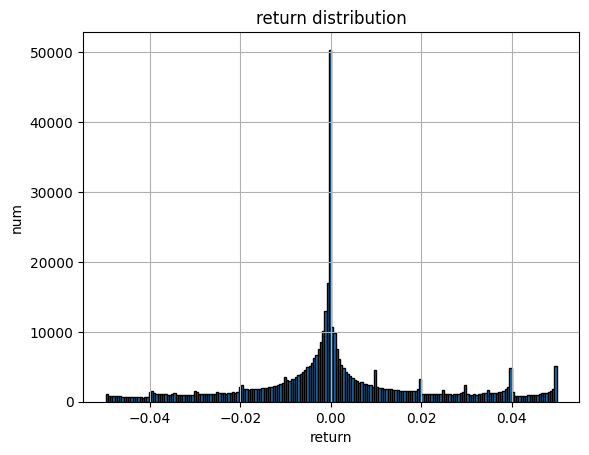

In [60]:
#Outliers check

panel_df['return'].hist(bins=200, edgecolor='black')

plt.title('return distribution')
plt.xlabel('return')
plt.ylabel('num')

plt.show()

In [61]:
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.io as pio

# Set the default renderer to notebook or iframe
pio.renderers.default = "notebook"

# Comparison of returns across different tickers
# This identifies which tickers are more volatile
fig_box = px.box(panel_df.reset_index(), x="ticker", y="return", 
                 title="Return Distribution by Ticker",
                 color="ticker")
fig_box.show()



In [62]:
# Create a flag for returns outside the standard 5% limit
panel_df['is_extreme'] = panel_df['return'].apply(lambda x: True if abs(x) > 0.051 else False)

# Compare average volume on extreme days vs normal days
avg_vol_extreme = panel_df[panel_df['is_extreme']]['volume'].mean()
avg_vol_normal = panel_df[~panel_df['is_extreme']]['volume'].mean()

print(f"Average volume on extreme days: {avg_vol_extreme}")
print(f"Average volume on normal days: {avg_vol_normal}")

Average volume on extreme days: nan
Average volume on normal days: 5109489.960656662


In [64]:
panel_df.to_csv('../data/cleaned/panel_df.csv', index=False)


**Metric Construction**

Derived financial features were constructed to enable risk, liquidity, and portfolio analysis.

In [ ]:
#concat all dataframes



for i in range(len(dfs)):
    #return
    dfs[i]['return'] = dfs[i]['close'].pct_change()
    #log return (Both simple and log returns are computed; analysis primarily uses simple returns for interpretability)
    dfs[i]['log_return'] = np.log(dfs[i]['close'] / dfs[i]['close'].shift(1))
    #removing the first row, NaN for return and log_return
    dfs[i] = dfs[i].dropna(subset=['return'])
    #Extreme daily returns beyond ±50% were removed to mitigate the impact of data errors and unadjusted corporate actions.
    dfs[i] = dfs[i][dfs[i]['return'].between(-0.5, 0.5)]
    #print(f"Remaining rows: {len(dfs[i])}")
    #market cap proxied by 30 days median value
    dfs[i]['size_proxy_value_median'] = dfs[i]['value'].rolling(30).median()





In [31]:


#median for all data\ market cap proxy
market_median_mcap = panel_df['size_proxy_value_median'].median()
# size of a company
panel_df['size_group'] = np.where(
    panel_df['size_proxy_value_median'] >= market_median_mcap,
    'Large',
    'Small'
)

KeyError: 'size_proxy_value_median'

In [ ]:
panel_df[['date', 'ticker']].isna().sum()

KeyError: "None of [Index(['date', 'ticker'], dtype='object')] are in the [columns]"

In [ ]:
panel_df['ticker'].nunique()
panel_df['ticker'].unique()
panel_df.index

KeyError: 'ticker'